In [1]:
import torch
from diffusers import AutoPipelineForImage2Image
from diffusers.utils import make_image_grid, load_image

pipeline = AutoPipelineForImage2Image.from_pretrained(
    "stabilityai/stable-diffusion-xl-refiner-1.0", torch_dtype=torch.float16, variant="fp16", use_safetensors=True
).to('cuda')
pipeline.enable_model_cpu_offload()
# remove following line if xFormers is not installed or you have PyTorch 2.0 or higher installed
#pipeline.enable_xformers_memory_efficient_attention()



Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

ValueError: Incorrect path or URL. URLs must start with `http://` or `https://`, and /home/descobar/projects/xbase/output/text2room/start_room01/full_trajectory/A_room_made_out_of_blue_powdered_walls_w/no_input_image_file/2024-08-21_17:31:30.290947Z/rgbd/rgbd_0002.png is not a valid path.

In [8]:
import torch
from diffusers import AutoPipelineForImage2Image
from diffusers.utils import make_image_grid, load_image

  0%|          | 0/25 [00:00<?, ?it/s]

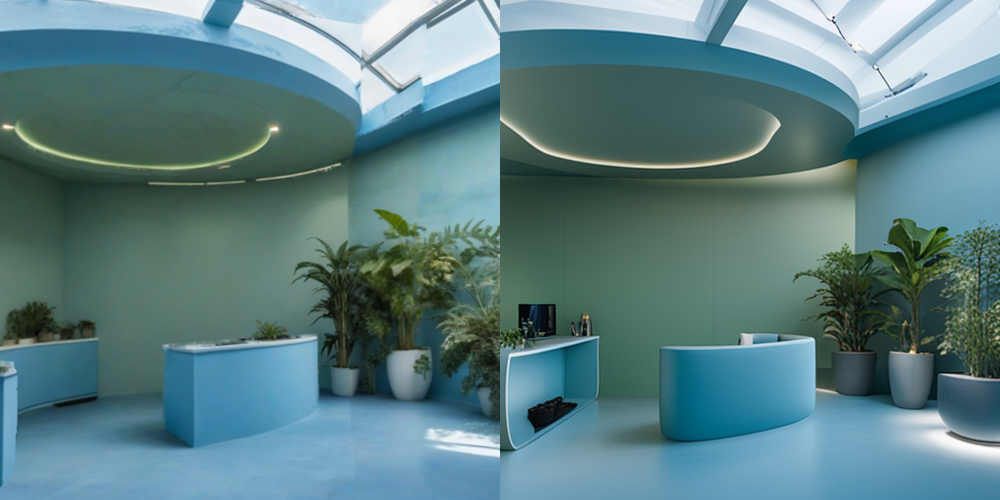

In [2]:
# prepare image
url = "/home/descobar/projects/xbase/output/text2room/start_room05/full_trajectory/photo_of_a_futuristic_space_made_out_of_/no_input_image_file/2024-08-22_00:10:56.999928Z/rgb/rgb_0003.png"
init_image = load_image(url)

prompt = "A room made out of blue powdered walls with the ceiling open to the blue sky, futuristic furniture and plants"

# pass prompt and image to pipeline
image = pipeline(prompt, image=init_image, strength=0.5).images[0]
make_image_grid([init_image, image], rows=1, cols=2)

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

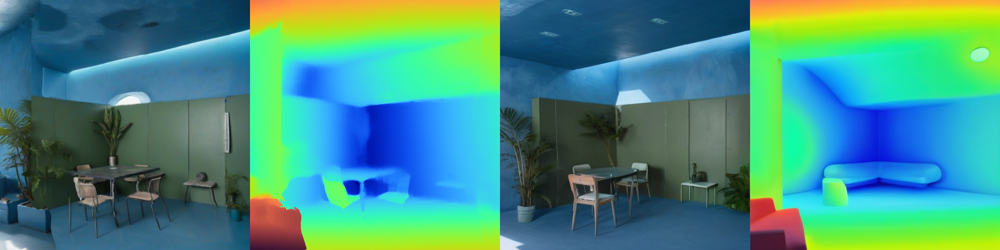

In [4]:
pipeline = AutoPipelineForImage2Image.from_pretrained(
    "SG161222/RealVisXL_V4.0", torch_dtype=torch.float16, variant="fp16", use_safetensors=True
).to('cuda')
pipeline.enable_model_cpu_offload()
# remove following line if xFormers is not installed or you have PyTorch 2.0 or higher installed
#pipeline.enable_xformers_memory_efficient_attention()

# prepare image
# prepare image
url = "/home/descobar/projects/xbase/output/text2room/start_room01/full_trajectory/A_room_made_out_of_blue_powdered_walls_w/no_input_image_file/2024-08-21_17:31:30.290947Z/rgbd/rgbd_0002.png"
init_image = load_image(url)

prompt = "A room made out of blue powdered walls with the ceiling open to the blue sky, futuristic furniture and plants"

# pass prompt and image to pipeline
image = pipeline(prompt, image=init_image, strength=0.5).images[0]
make_image_grid([init_image, image], rows=1, cols=2)

In [ ]:
pipeline = AutoPipelineForImage2Image.from_pretrained(
    "SG161222/RealVisXL_V4.0", torch_dtype=torch.float16, variant="fp16", use_safetensors=True
).to('cuda')
pipeline.enable_model_cpu_offload()
# remove following line if xFormers is not installed or you have PyTorch 2.0 or higher installed
#pipeline.enable_xformers_memory_efficient_attention()

# prepare image
# prepare image
url = "/home/descobar/projects/xbase/output/text2room/start_room01/full_trajectory/A_room_made_out_of_blue_powdered_walls_w/no_input_image_file/2024-08-21_17:31:30.290947Z/rgb/rgb_0003.png"
init_image = load_image(url)

prompt = "A room made out of blue powdered walls with the ceiling open to the blue sky, futuristic furniture and plants"

# pass prompt and image to pipeline
image = pipeline(prompt, image=init_image, strength=0.5).images[0]
make_image_grid([init_image, image], rows=1, cols=2)

  0%|          | 0/15 [00:00<?, ?it/s]

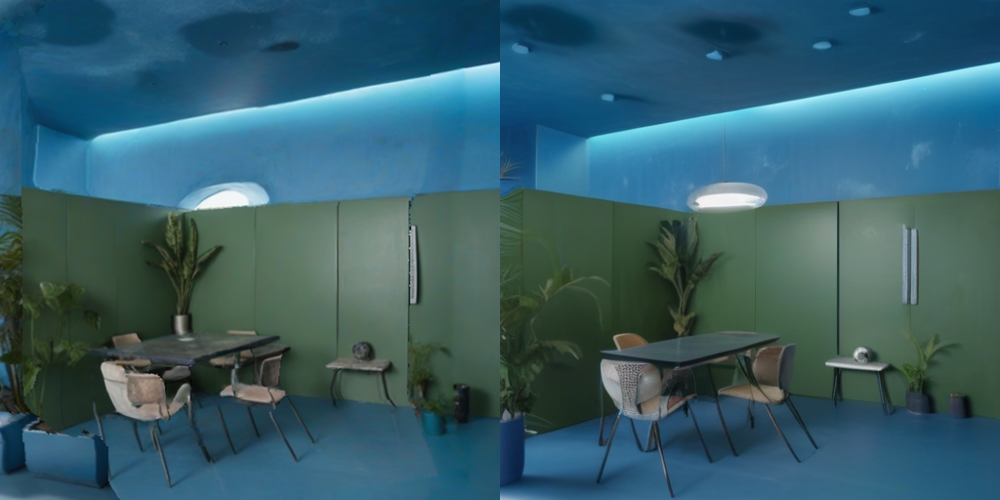

In [7]:
prompt = "A room made out of blue powdered walls with the ceiling open to the blue sky, futuristic furniture and plants, 4k high definition"

# pass prompt and image to pipeline
image = pipeline(prompt, image=init_image, strength=0.3).images[0]
make_image_grid([init_image, image], rows=1, cols=2)

  0%|          | 0/20 [00:00<?, ?it/s]

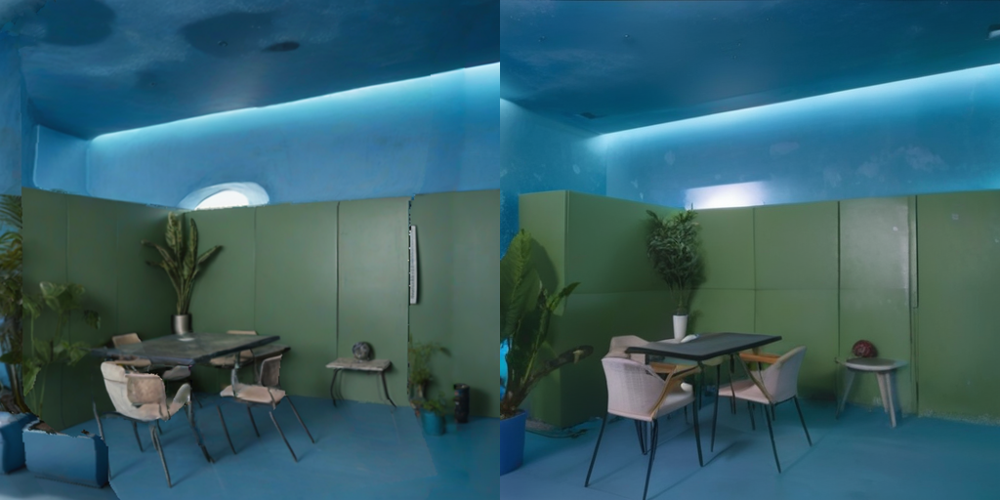

: 

In [8]:
prompt = "A room made out of blue powdered walls with the ceiling open to the blue sky, futuristic furniture and plants, 4k high definition"

# pass prompt and image to pipeline
image = pipeline(prompt, image=init_image, strength=0.4).images[0]
make_image_grid([init_image, image], rows=1, cols=2)

In [1]:
import os
import torch
from diffusers import AutoPipelineForInpainting, UNet2DConditionModel,StableDiffusionXLInpaintPipeline

from PIL import Image
import numpy as np
from diffusers.utils import load_image

pipe = StableDiffusionXLInpaintPipeline.from_pretrained(
        "SG161222/RealVisXL_V4.0",
        torch_dtype=torch.float16,
        variant="fp16",
        use_safetensors=True,
        ).to('cuda')
    
pipe.enable_model_cpu_offload()

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

<PIL.Image.Image image mode=RGB size=1024x1024 at 0x7F4F0A70E6B0> <PIL.Image.Image image mode=RGB size=1024x1024 at 0x7F4F0A70DD20>


  0%|          | 0/35 [00:00<?, ?it/s]

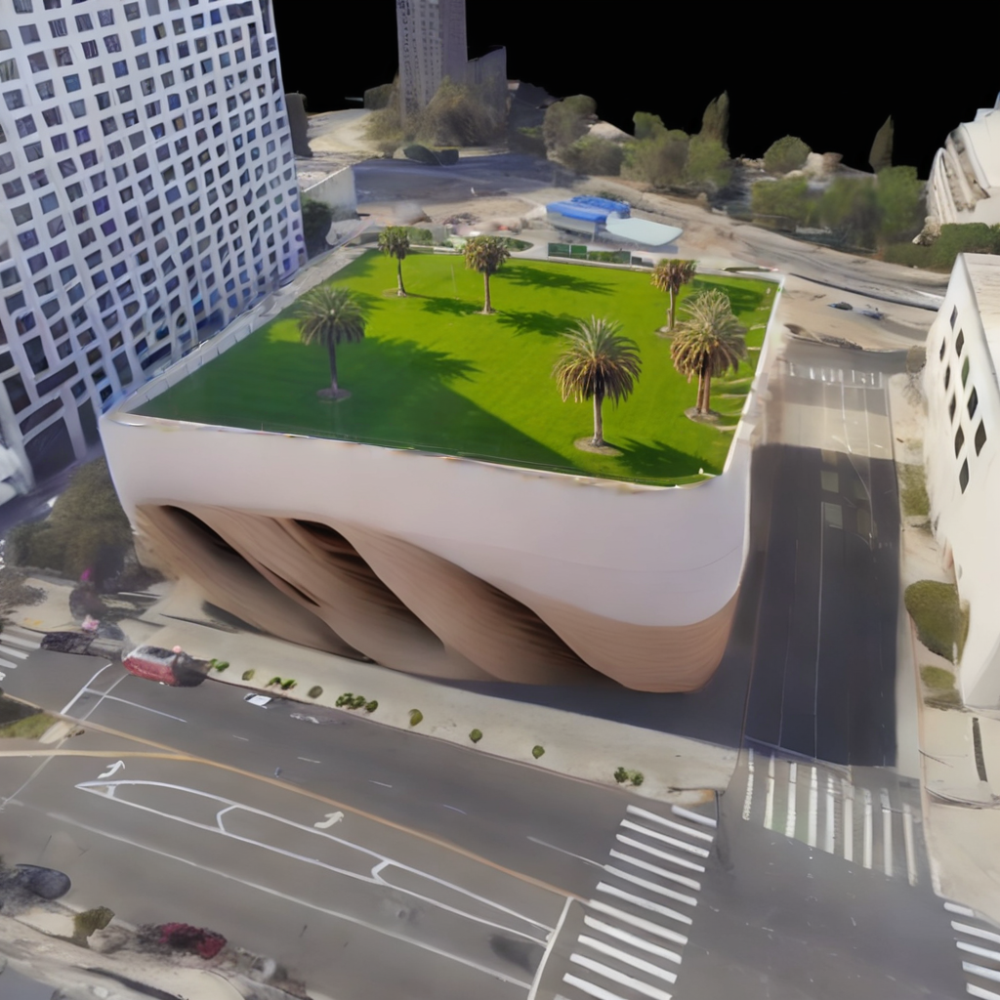

In [63]:
init_image = load_image("/home/descobar/projects/xbase/samples/images/r_16.png").convert("RGB")
init_image = init_image.resize((1024, 1024), Image.Resampling.LANCZOS)
mask_image = load_image('/home/descobar/projects/xbase/samples/masks/Mask01.png').convert("RGB")
mask_image = mask_image.resize((1024, 1024), Image.Resampling.LANCZOS)
random_seed = 2

prompt = "a drone view of tall palm trees surrounded by green healthy grass on top of modern design office building in los angeles"
#prompt = "a green urban outdoor roof on top of a building"
print(init_image, mask_image)
generator = torch.manual_seed(random_seed)

image = pipe(prompt=prompt, 
                image=init_image,
                guidance_scale = 10,
                mask_image=mask_image, 
                num_inference_steps=50, 
                strength=0.7,
                generator=generator,
            ).images[0]

image

In [6]:
def load_refiner_model():
    import torch
    from diffusers import AutoPipelineForImage2Image
    pipeline = AutoPipelineForImage2Image.from_pretrained(
            "SG161222/RealVisXL_V4.0", torch_dtype=torch.float16, variant="fp16", use_safetensors=True
            ).to('cuda')
    pipeline.enable_model_cpu_offload()
    return pipeline

refiner = load_refiner_model()

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

In [64]:
#prompt = self.args.prompt
# pass prompt and image to pipeline
init_image= image
image = refiner(prompt, image=init_image, strength=0.3).images[0]
comparison_image = make_image_grid([init_image, image], rows=1, cols=2)

  0%|          | 0/15 [00:00<?, ?it/s]

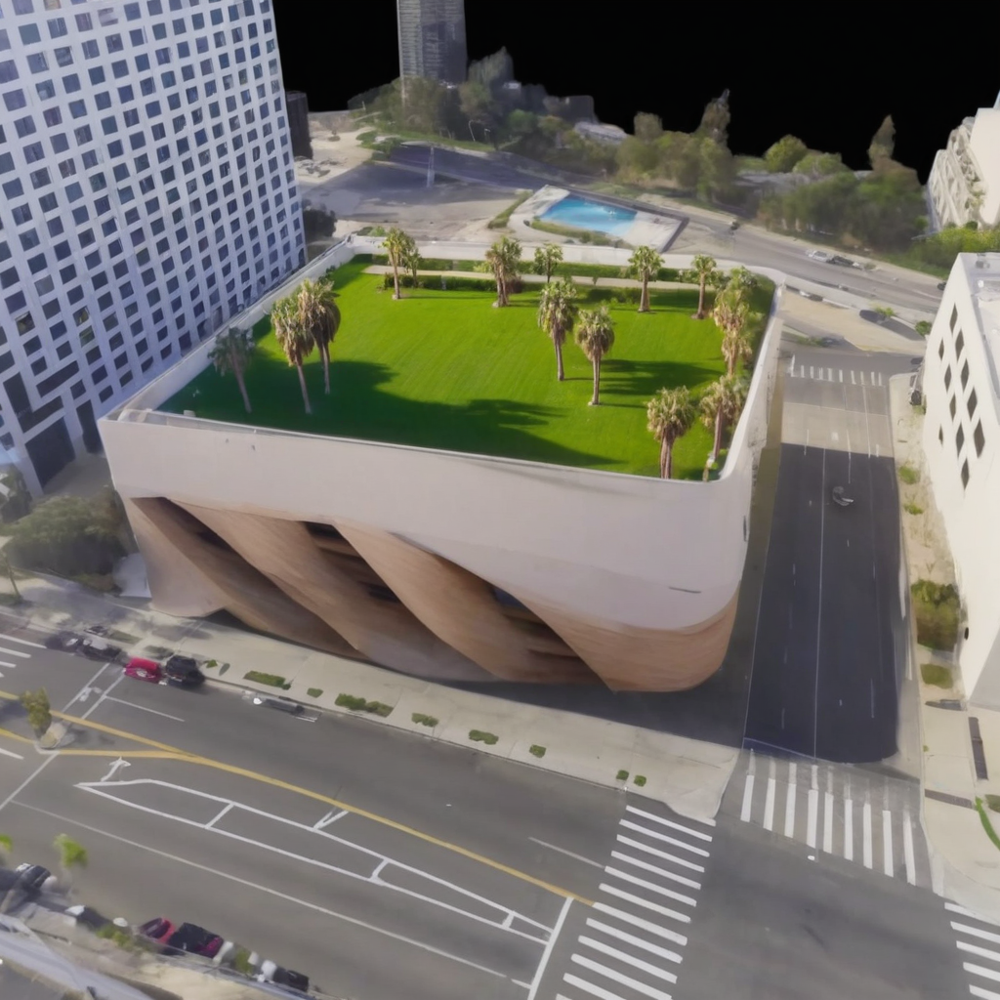

In [60]:
image

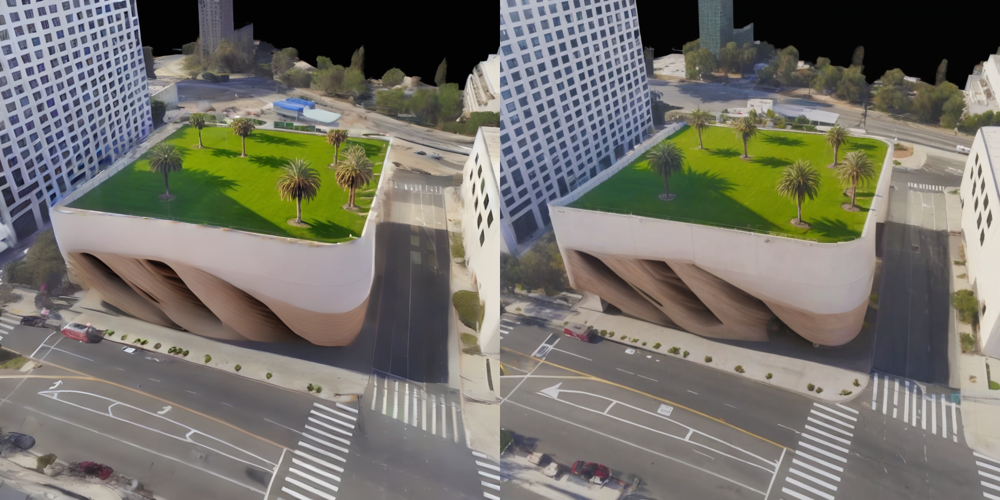

In [65]:
comparison_image